(sec-hgate)=
# Hadamard gate

This is another very important one-qubit gate.  It changes basis set between $\{|0\rangle,|1\rangle\}$ and $\{|+\rangle,|-\rangle\}$.  We shall call this gate simply HGate.

[API References: HGate](https://qiskit.org/documentation/stubs/qiskit.circuit.library.HGate.html#qiskit.circuit.library.HGate)

## Definition

**Transformation**
>$$
H |0\rangle = |+\rangle, \qquad H |1\rangle = |-\rangle
$$(HGate)

This is the standard way to generate the $x$-basis ({eq}`XBasis` from the computational basis.

**Matrix expression**

>$$
H \doteq \frac{1}{\sqrt{2}} \begin{bmatrix} 1 & 1 \\ 1 & -1 \end{bmatrix}
$$(HGate-matrix)

**U gate expression**

>$$
H = U\left(\frac{\pi}{2},0,\pi\right)
$$(HGate-U)

**R Gate expression**

>$$
H = i \, R_x(\pi) \cdot R_y\left(\frac{\pi}{2}\right)
$$

The Qiskit circuit code symbol is 'h' and it appears in quantum circuit as

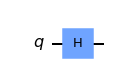

In [3]:
from qiskit import QuantumCircuit
qc=QuantumCircuit(1)
qc.h(0)
qc.draw('mpl')

or

In [2]:
qc.draw()

┌───┐
q: ┤ H ├
   └───┘


---
**Exercise** {numref}`%s <sec-HGate>`.1&nbsp; Show that $H^{-1}=H$. This means that the $x$-basis is transformed to the computational basis by $H$ gates.  

>$$
H |+\rangle = |0\rangle, \quad H|-\rangle = |1\rangle
$$(HGate-inv)



---
**Qiskit Example** {numref}`%s <sec-hgate>`.1&nbsp; A common use of the Hadamard gate is to switch the basis set.  In the quantum simulation of coin tossing (Qiskit Example {numref}`%s <sec-qubit-measurement>`.1) we have already used a Hadamard gate to generate $+\rangle$.
Here we flip $|0\rangle$ to $|1\rangle$ via the $x$-basis.  First, we switch the basis from $|0\rangle$ to $|+\rangle$ by HGate.  Flip $|+\rangle$ to $|-\rangle$ by ZGate.  Then, switch back to the original basis by HGate.  The final state is $|1\rangle$. 


$$
|0\rangle \xrightarrow{H} |+\rangle \xrightarrow{Z} |-\rangle \xrightarrow{H} |1\rangle
$$

This means $X = H \cdot Z \cdot H$.
In this example, the following process is visualized with Qiskit.


In [2]:
%%capture
from qiskit import *
from qiskit.visualization import visualize_transition

qc=QuantumCircuit(1)

qc.h(0)
qc.z(0)
qc.h(0)

movie=visualize_transition(qc,fpg=50, spg=1)

In [3]:
movie

(sec-hgate-qft)=
## Acting on a superposition state

The $H$ gate transforms a super position state in an interesting way:

>$$
H \left (c_0 |0\rangle + c_1 |1\rangle\right)  = c_0 |+\rangle + c_1 |-\rangle)
=\frac{1}{\sqrt{2}}\left(c_0+c_1\right) |0\rangle + \frac{1}{\sqrt{2}}\left(c_0-c_1\right) |1\rangle
$$(H-on-superpos)

Apart from the normalization constant $\frac{1}{\sqrt{2}}$, it computes addition and subtraction of the coefficients simultaneously, which is actually a Fourier transform (See {numref}`sec-qft`.).  In therms of physics, the Hadamard gate "computes" constructive and destructive interference simultaneously.  We will be using this property in may applications.


(ex-hgate-interference)=
## Qiskit example: 

We demonstrate Eq. {eq}`H-on-superpos` using Qiskit.  Suppose that the qubit is in a superposition state $\cos(\pi/6) |0\rangle + \sin(\pi/6)|1\rangle$.  We want to find $\cos(\pi/6)+\sin(\pi/6)$ and $\cos(\pi/6)-\sin(\pi/6)$ using the Hadamard gate.  First, we construct a quantum circuit and test it with Statevector function.  Recall that this is not a quantum computation since we cheat by using `initialization` and `Statevector` function. I next example, we try to find the solution by quantum computation.

In [4]:
# import QuatumCircuit and QuantumRegister classes.
from qiskit import *
from qiskit.opflow import Zero, One

# import STatevector class
from qiskit.quantum_info import Statevector

# import numpy
import numpy as np

theta=np.pi/3

c0=np.cos(theta/2)
c1=np.sin(theta/2)

ket0=c0*Zero +c1*One

# Preparation
qr=QuantumRegister(1,'q') # create a single qubit with name 'q'.
qc=QuantumCircuit(qr)  # create a quantum circuit

# set the qubit to |L> 
qc.initialize(ket0.to_matrix(),0)

# apply Xgate
qc.h(0)

# Final state
ket1=Statevector(qc).data*np.sqrt(2)

# COmpare 
print("c0+c1: Hadamard = ",ket1[0],"   Direct calculation",c0+c1)
print("c0-c1: Hadamard = ",ket1[1],"   Direct calculation",c0-c1)

c0+c1: Hadamard =  (1.3660254037844384+0j)    Direct calculation 1.3660254037844386
c0-c1: Hadamard =  (0.3660254037844388+0j)    Direct calculation 0.36602540378443876


The above calculation mathematically confirms that the Hadamard gate computes the addition and subtraction.  Now, we want to solve it using quantum computation. Although there is no advantage over classical computation, we can see how quantum computation calculate two things, addition and subtraction, simultaneously (quantum parallelism). Using the  Born rule, the probability that the outcome of measurement is $|0\rangle$ is given by $p_0 = (c_0+c_1)^2/2$ and similarly for $|1\rangle$ $p_1 = (c_0-c_1)^2/2$.  By repeating quantum computation, many times, we can estimate $p_0$ and $p_1$.  From the probabilities we obtain $|c_0 + c_1| = \sqrt{2 p_0}$ and $|c_0-c_1| = \sqrt{2 p_1}$.  This approach give us only the modulus of the target quantities.  We can run the quantum calculation only finite times, the result is not exact.  Nevertheless, the results good enough with 10000 tries.

In [7]:
from qiskit import *  # import qiskit

# Preparation
qr=QuantumRegister(1,'q') # create a single qubit named 'q'.
cr=ClassicalRegister(1,'c') # create a single classical bit named 'c'
qc=QuantumCircuit(qr,cr)  # create a quantum circuit

# create the desired superpositionstate using RyGate
qc.ry(theta,0)

# apply Hadamard gate
qc.h(0)

# measure the qubit state
qc.measure(qr,cr)

# The quantum circuit has been constructed.  
qc.draw()

┌─────────┐┌───┐┌─┐
  q: ┤ Ry(π/3) ├┤ H ├┤M├
     └─────────┘└───┘└╥┘
c: 1/═════════════════╩═
                      0

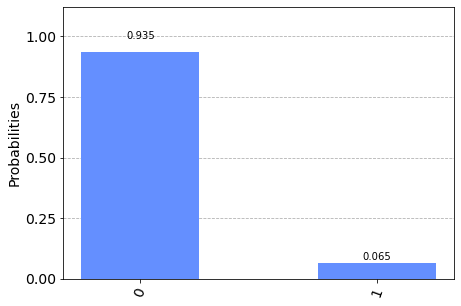

In [8]:
# Now we execute the circuit

# Chose a general quantum simulator without noise.
# The simulator behaves as an ideal quantum computer.
backend = Aer.get_backend('qasm_simulator')

# set number of tries
nshots=10000

# execute the quantum circuit and store the outcome
job = backend.run(qc,shots=nshots)

# extract the result
result = job.result()

# count the outcome
counts = result.get_counts()

# Visualize the outcome
# import histgram plotting function
from qiskit.visualization import plot_histogram
plot_histogram(counts)


In [6]:
# post analysis
# the outcome of counting is stored in  dict data type
# compute the probabilities
p0=counts['0']/nshots
p1=counts['1']/nshots

# estimate the addition and subtraction from the probabilities
# (this part is classical computation)
add=np.sqrt(2*p0)
sub=np.sqrt(2*p1)

# Compare the results
print("c0+c1: quantum = {:6.3f}   classical {:6.3f}".format(add,c0+c1))
print("c0-c1: quantum = {:6.3f}   classical {:6.3f}".format(sub,c0-c1))


c0+c1: quantum =  1.364   Direct calculation  1.366
c0-c1: quantum =  0.372   Direct calculation  0.366


## Important Properties

> $H^2 = I$

This means that
1.  $H^2$ does not do any thing on the qubit.
2.  $H$ is  self-inverse, that is $H^{-1} = H$.
3.  $H$ is self-adjoint ($H^\dagger = H$) since $H$ is unitary ($H^\dagger = H^{-1}$) by definition.


---
**Exercise** {numref}`%s <sec-hgate>`.2&nbsp;  Knowing that $X = H \cdot Z \cdot H$, show that the following relations are true.

1. $Z = H \cdot X \cdot H$
2. $Z \cdot H = H \cdot X$
3. $H \cdot Z = X \cdot H$

These relations are used to simplify quantum circuits.



---
**Exercise** {numref}`%s <sec-hgate>`.3&nbsp;  Prove that $H \cdot Y \cdot H = -Y$.   Essentially, $Y$ acts in the same way in both the computational basis and $|\pm\rangle$ basis.


---
Last modified: 08/31/2022